In [1]:
%load_ext autoreload
%autoreload 2
%env CUDA_VISIBLE_DEVICES=0

env: CUDA_VISIBLE_DEVICES=0


In [2]:
from PIL import Image
from pathlib import Path
from matplotlib import pyplot as plt

import wandb
import numpy as np
import torch as t
import torchvision
from tqdm.auto import tqdm, trange

In [3]:
class MNIST(t.utils.data.Dataset):
    def __init__(self, data_root: Path):
        imgs = []
        for img, _ in tqdm(torchvision.datasets.MNIST(data_root, download=True)):
            img = img.resize((32, 32), Image.Resampling.BILINEAR)
            img = np.array(img)[None, :, :]
            img = img / 255
            imgs.append(img)
            
        self.imgs = t.tensor(np.stack(imgs), dtype=t.float)
        
    def __len__(self):
        return self.imgs.shape[0]
    
    def __getitem__(self, index):
        return self.imgs[index]

    def shuffled_batch_iterate(self, batch_size: int):
        while True:
            inds = t.randint(0, self.imgs.shape[0], [batch_size])
            yield self.imgs[inds]

In [4]:
Z_DIM = 2


def conv_block(in_features: int, out_features: int, kernel: int = 3, stride: int = 1, padding: int = 1):
    return t.nn.Sequential(
        t.nn.Conv2d(in_features, out_features, kernel, stride, padding),
        t.nn.BatchNorm2d(out_features),
        t.nn.ReLU(),
    )


class Upscale(t.nn.Module):
    def __init__(self, in_features: int, out_features: int):
        super().__init__()
        self.conv = conv_block(in_features, 4 * out_features)
        
    def forward(self, x: t.Tensor) -> t.Tensor:
        x = self.conv(x)
        b, c, h, w = x.shape
        x = x.reshape(b, c // 4, 2, 2, h, w)
        x = t.moveaxis(x, (0, 1, 4, 2, 5, 3), (0, 1, 2, 3, 4, 5))
        x = x.reshape(b, c // 4, h * 2, w * 2)
        
        return x

    
class Squeeze(t.nn.Module):
    def forward(self, x):
        return x.squeeze(2).squeeze(2)
    
    
class Unsqueeze(t.nn.Module):
    def forward(self, x):
        return x[:, :, None, None]
    
    
def downscale_block(features: int, out_features: int):
    return t.nn.Sequential(
        conv_block(features, features),
        conv_block(features, features),
        conv_block(features, out_features, 2, 2, 0)
    )

    
def upscale_block(in_features: int, features: int):
    return t.nn.Sequential(
        Upscale(in_features, features),
        conv_block(features, features),
        conv_block(features, features),
    )


def get_encoder():
    return t.nn.Sequential(
        conv_block(1, 8),
        downscale_block(8, 16),
        downscale_block(16, 32),
        downscale_block(32, 64),
        downscale_block(64, 64),
        downscale_block(64, 128),
        Squeeze(),
        t.nn.Linear(128, Z_DIM * 2),
    )


def get_decoder():
    return t.nn.Sequential(
        Unsqueeze(),
        upscale_block(Z_DIM, 128),
        upscale_block(128, 64),
        upscale_block(64, 32),
        upscale_block(32, 16),
        upscale_block(16, 8),
        t.nn.Conv2d(8, 1, 3, padding=1),
    )

In [5]:
def reparameterize(mean, log_std):
    return mean + t.randn_like(mean) * t.exp(log_std)


def kl(mean, log_std):
    return ((t.exp(2 * log_std) + mean * mean) / 2 - 0.5 - log_std).sum(axis=1)


class VAE(t.nn.Module):
    def __init__(self, encoder, decoder):
        super().__init__()
        
        self.encoder = encoder
        self.decoder = decoder
        
    def forward(self, imgs):
        z_params = self.encoder(imgs)
        z_mean, z_log_std = t.split(z_params, [Z_DIM, Z_DIM], dim=1)

        z = reparameterize(z_mean, z_log_std)
        z_kl = kl(z_mean, z_log_std)

        decoded_imgs = self.decoder(z)
        log_p_x_given_z = -((imgs - decoded_imgs)**2).sum([1, 2, 3])

        loss = -log_p_x_given_z + z_kl 

        return {'loss': loss.mean(), 'log p(x|z)': log_p_x_given_z.mean(), 'kl': z_kl.mean()}


model crated
optimzer created


  0%|          | 0/60000 [00:00<?, ?it/s]

model created
torch.Size([1, 32, 32])


wandb: Currently logged in as: pg_lolo. Use `wandb login --relogin` to force relogin


0it [00:00, ?it/s]

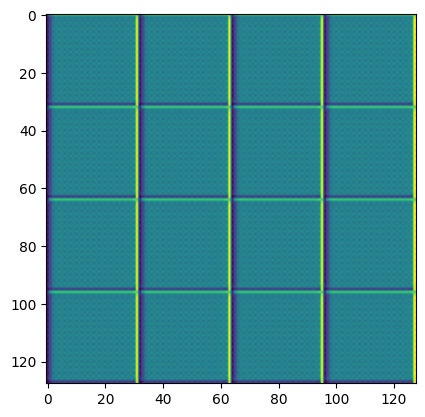

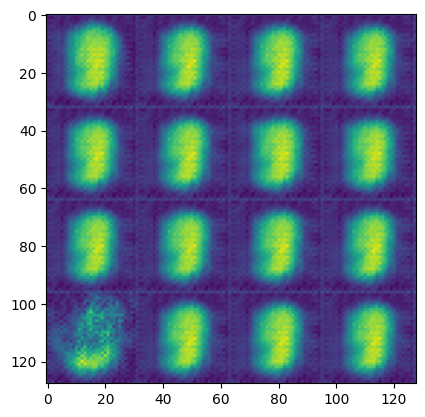

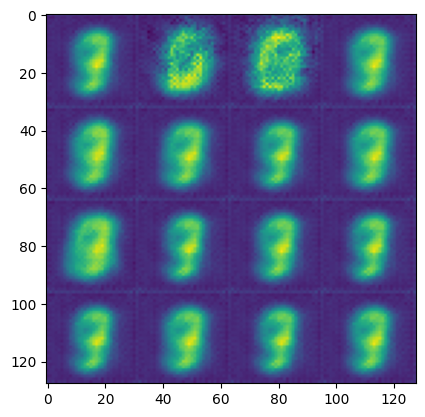

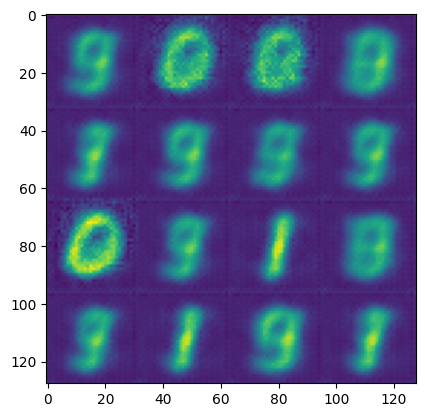

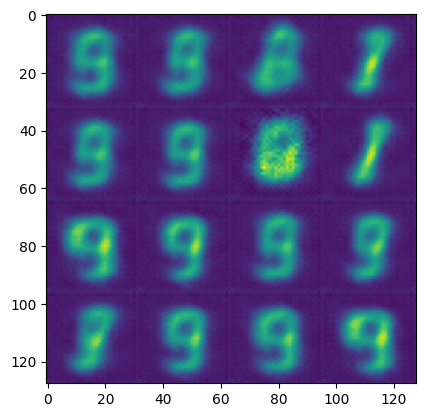

...

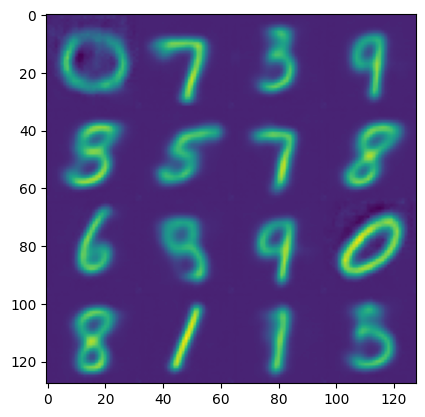

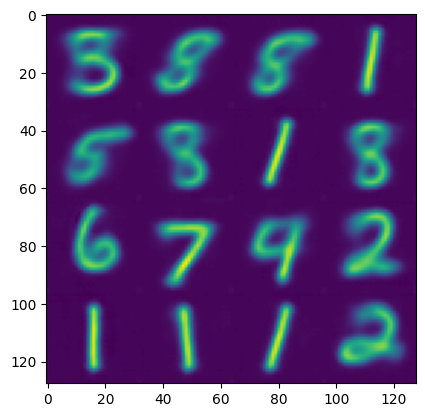

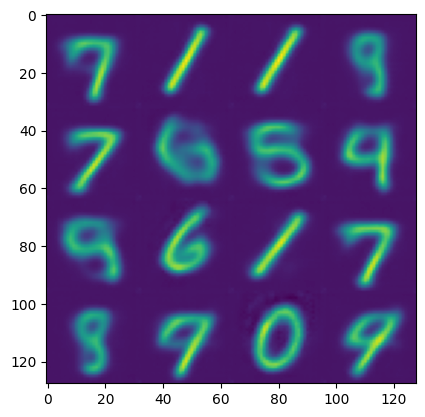

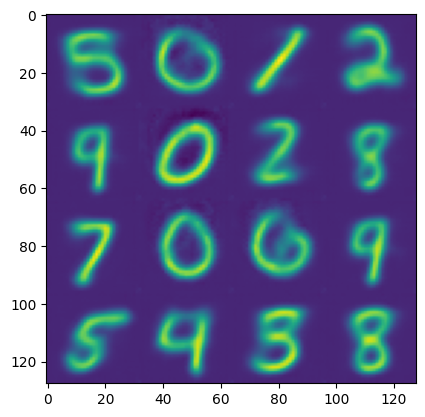

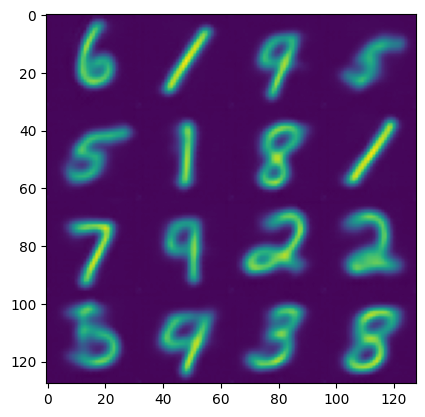

In [6]:
BATCH_SIZE = 128

# def run():
#     with wandb.init(project='autoencoder'):

model = VAE(get_encoder(), get_decoder()).cuda()
print('model crated')

optimizer = t.optim.AdamW(model.parameters())
print('optimzer created')

data = MNIST('./')
print('model created')

model.eval()
print(data[0].shape)
model(data[0][None].cuda())
model.train()

wandb.init(project='autoencoder')
for step, imgs in enumerate(tqdm(data.shuffled_batch_iterate(BATCH_SIZE))):
    imgs = imgs.cuda()
    values = model(imgs)

    wandb.log(values, step=step)

    values['loss'].backward()
    optimizer.step()
    optimizer.zero_grad()

    if step % 50 == 0:
        model.eval()

        with t.no_grad():
            z = t.randn(16, Z_DIM, device='cuda')
            img = model.decoder(z)
            img = img.detach().cpu().numpy()
            img = img.transpose(0, 2, 3, 1)
            img = img.reshape(4, 4, 32, 32, 1)
            img = img.transpose(0, 2, 1, 3, 4)
            img = img.reshape(4 * 32, 4 * 32, 1)
            plt.imshow(img)
            plt.show()

        model.train()

    if step > 3000:
        break

# run()

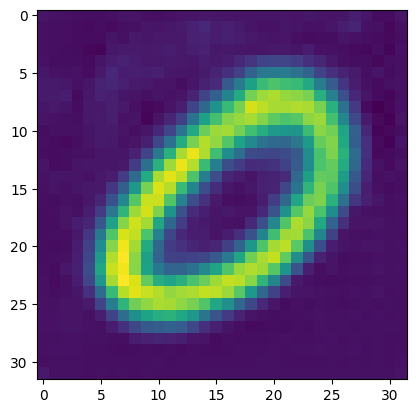

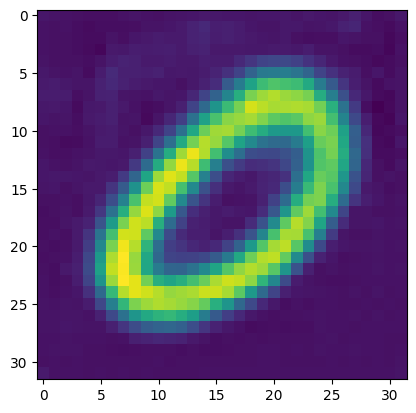

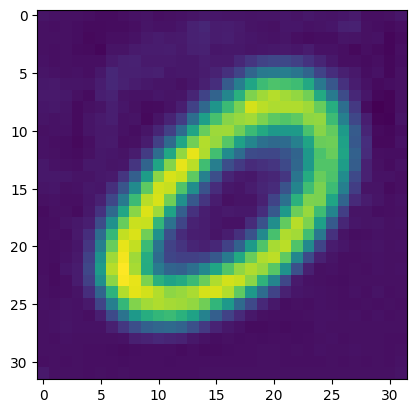

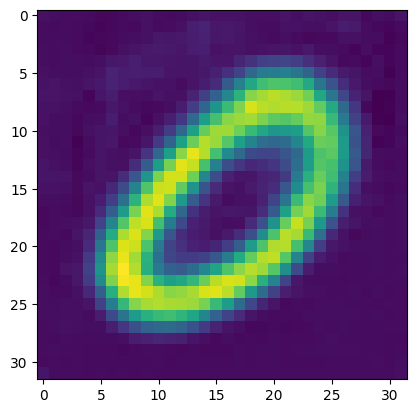

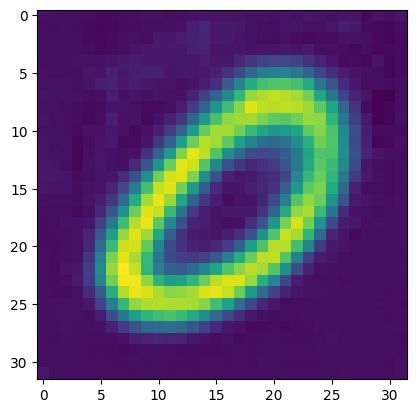

...

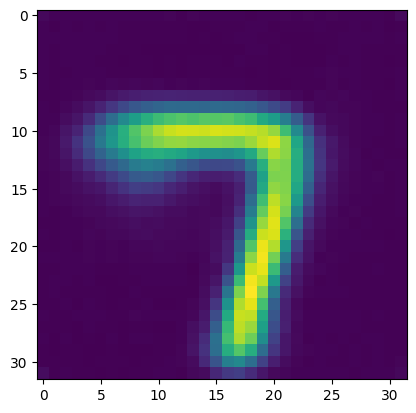

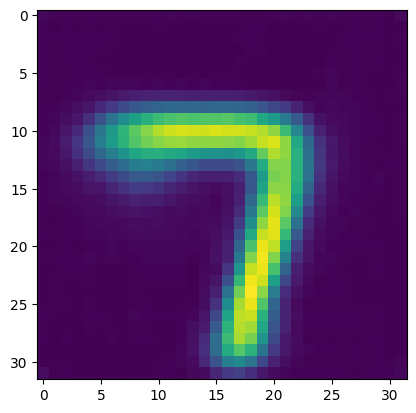

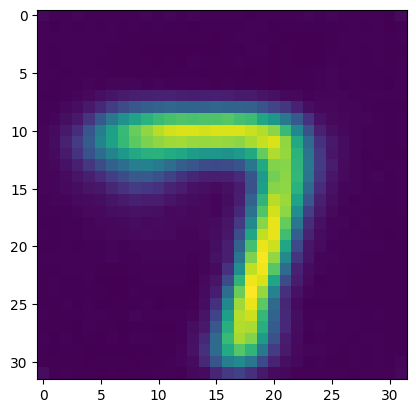

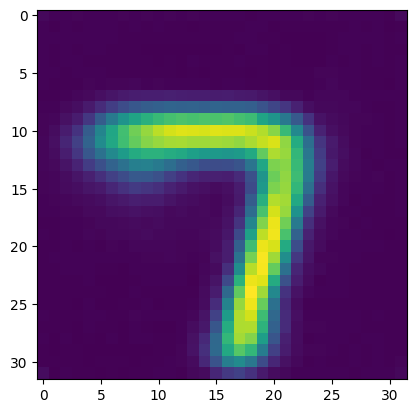

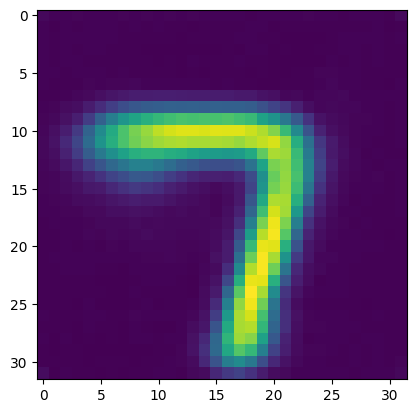

In [9]:
model.eval()

start = -2 * t.ones(2)
end = 2 * t.ones(2)

points = t.linspace(0, 1, 100)[:, None]
points = end[None, :] * points + start[None, :] * (1 - points)

imgs = model.decoder(points.cuda()).detach().cpu().numpy()

for img in imgs:
    plt.imshow(img[0])
    plt.show()